<a href="https://colab.research.google.com/github/Raden616Rizki/PCVK_Ganjil_2023/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

**A. Latihan Praktikum**

**Object Detection**

---

1. Template Matching
2. Edge Detection
3. Corner Detection
4. Grid Detection
5. Contour Detection

**Template Matching**

---

Menggunakan library openCV:

**cv.matchTemplate()**, dengan parameter:

- **image**: citra input

- **templ**: template yang dicari, ukurannya tidak boleh lebih besar dari citra input

- **method**: metode dari template matching

Jenis metode template matching di OpenCV:

- TM_SQDIFF
- TM_SQDIFF_NORMED
- TM_CCORR
- TM_CCORR_NORMED
- TM_CCOEFF
- TM_CCOEFF_NORMED

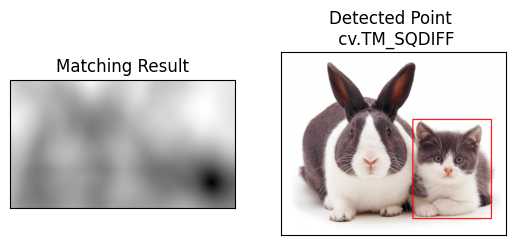

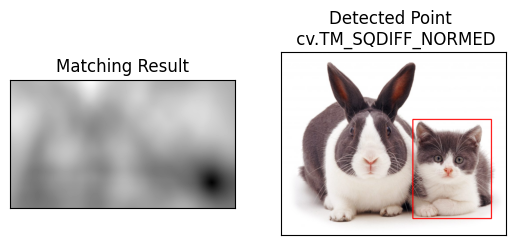

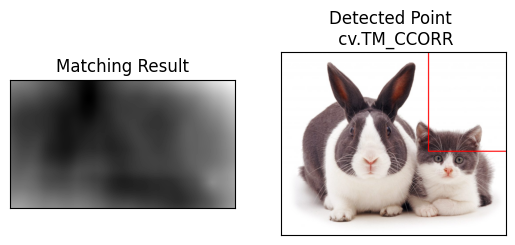

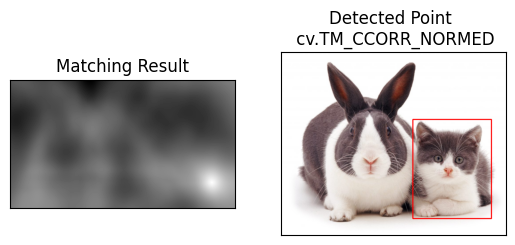

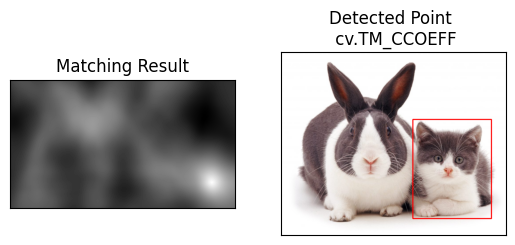

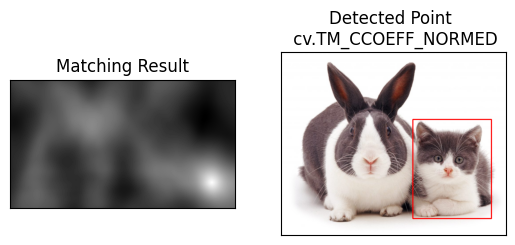

In [3]:
source = cv.imread('/content/drive/MyDrive/Images/cats_and_bunnies.jpg')
source = cv.cvtColor(source, cv.COLOR_BGR2RGB)

template = cv.imread('/content/drive/MyDrive/Images/cat2_templatejpg.jpg')
h = template.shape[0]
w = template.shape[1]
methods = ['cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED', 'cv.TM_CCORR', 'cv.TM_CCORR_NORMED', 'cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED']

for method in methods:
  source_1 = source.copy()
  template_1 = template.copy()

  matching_method = eval(method)
  result = cv.matchTemplate(image=source_1, templ=template_1, method=matching_method)

  min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

  # Ambil nilai minimum jika method TM_SQDIFF dan TM_SQDIFF_NORMED
  if matching_method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
    top_left = min_loc
  else:
    top_left = max_loc

  bottom_right = (top_left[0] + w, top_left[1] + h)
  cv.rectangle(source_1, top_left, bottom_right, 255, 4)

  plt.subplot(121), plt.imshow(result, cmap='gray')
  plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
  plt.subplot(122), plt.imshow(source_1)
  plt.title(f'Detected Point \n {method}'), plt.xticks([]), plt.yticks([])

  plt.show()

**Template Matching non OpenCV Bahrain**

In [ ]:
source = cv.imread('/content/drive/MyDrive/Images/bahrain.jpg')
template = cv.imread('/content/drive/MyDrive/Images/bahrain-template.jpg')

**Edge Detection**

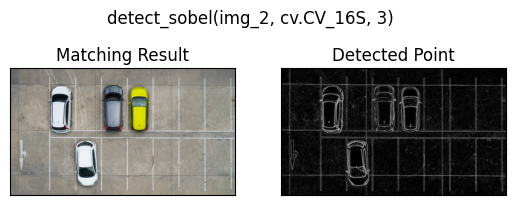

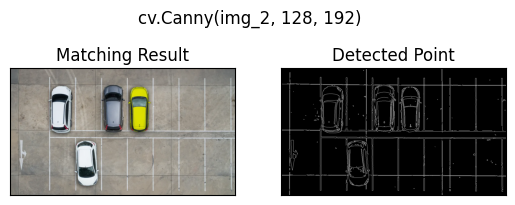

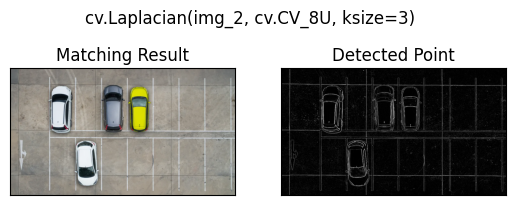

In [27]:
def detect_sobel(img, ddepth, kernel):
  sobel_x = cv.Sobel(img_2, ddepth, 1, 0, kernel)
  sobel_y = cv.Sobel(img_2, ddepth, 0, 1, kernel)

  abs_sobel_x = cv.convertScaleAbs(sobel_x)
  abs_sobel_y = cv.convertScaleAbs(sobel_y)

  result = cv.addWeighted(abs_sobel_x, 0.5, abs_sobel_y, 0.5, 0)

  return result

img = cv.imread('/content/drive/MyDrive/Images/car-park.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_1 = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

sobel = 'detect_sobel(img_2, cv.CV_16S, 3)'
canny = 'cv.Canny(img_2, 128, 192)'
laplacian = 'cv.Laplacian(img_2, cv.CV_8U, ksize=3)'

methods = [sobel, canny, laplacian]

for method in methods:
  img_2 = cv.GaussianBlur(img_1, (3, 3), 0.5)

  result = eval(method)

  plt.subplot(121), plt.imshow(img_rgb)
  plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
  plt.subplot(122), plt.imshow(result, cmap='gray')
  plt.title(f'Detected Point'), plt.xticks([]), plt.yticks([])
  plt.suptitle(method, y=0.75)

  plt.show()

**Corner Detection**

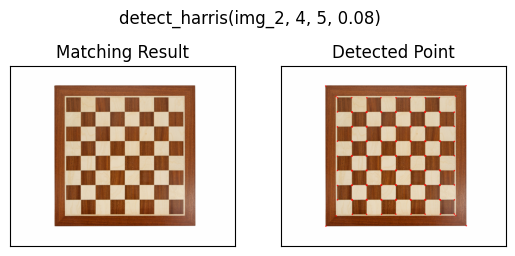

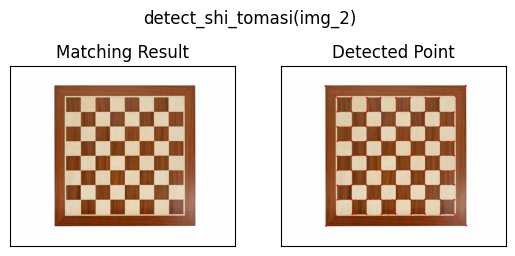

In [45]:
def detect_harris(img, blockSize, ksize, k):
  img_1 = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  img_2 = np.float32(img_1)

  result = cv.cornerHarris(img_2, blockSize=blockSize, ksize=ksize, k=k)
  result_1 = cv.dilate(result, None) # dilasi

  img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
  img[result_1 > 0.01 * result_1.max()] = [255, 0, 0] # tresholding

  return img

def detect_shi_tomasi(img):
  img_1 = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  corners = cv.goodFeaturesToTrack(img_1, maxCorners=96, qualityLevel=0.01, minDistance=8)
  corners = np.int0(corners) # Ubah ke integer

  img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

  # Menggambar sudut
  for corner in corners:
    x, y = corner.ravel()
    cv.circle(img, (x, y), 4, 255, -1)

  return img

img = cv.imread('/content/drive/MyDrive/Images/chess-board.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

harris = 'detect_harris(img_2, 4, 5, 0.08)'
shi_tomasi = 'detect_shi_tomasi(img_2)'

methods = [harris, shi_tomasi]

for method in methods:
  img_2 = img.copy()

  result = eval(method)

  plt.subplot(121), plt.imshow(img_rgb)
  plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
  plt.subplot(122), plt.imshow(result, cmap='gray')
  plt.title(f'Detected Point'), plt.xticks([]), plt.yticks([])
  plt.suptitle(method, y=0.8)

  plt.show()

**B. Pengayaan Materi KTP**

141.0 (488, 800)


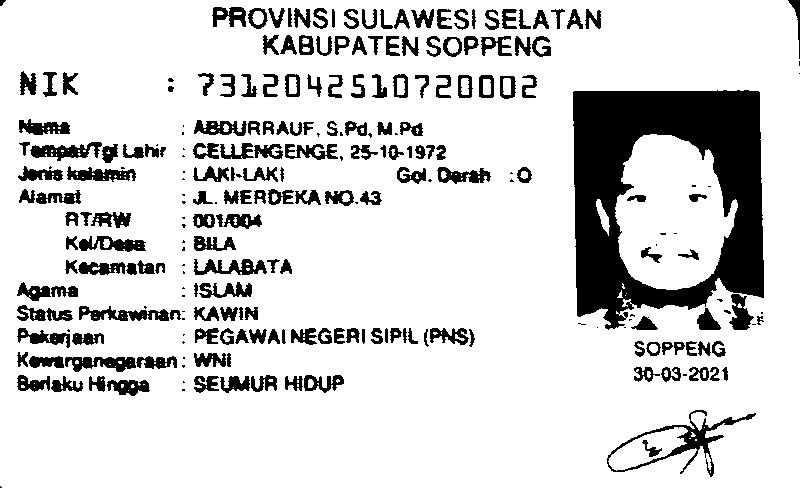

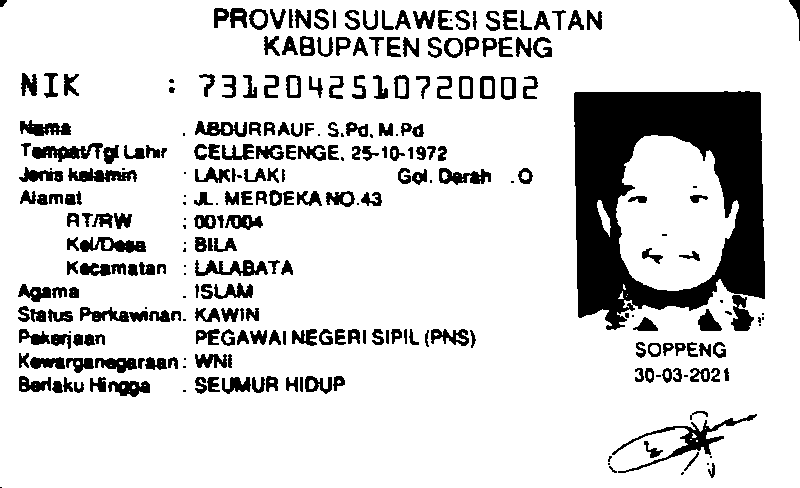

156.0 (680, 1055)


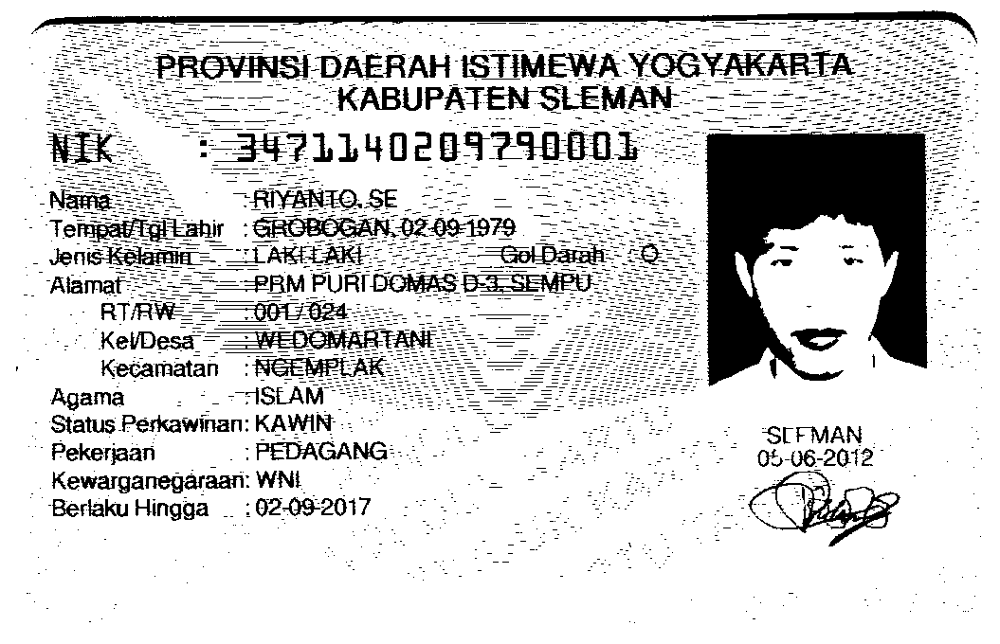

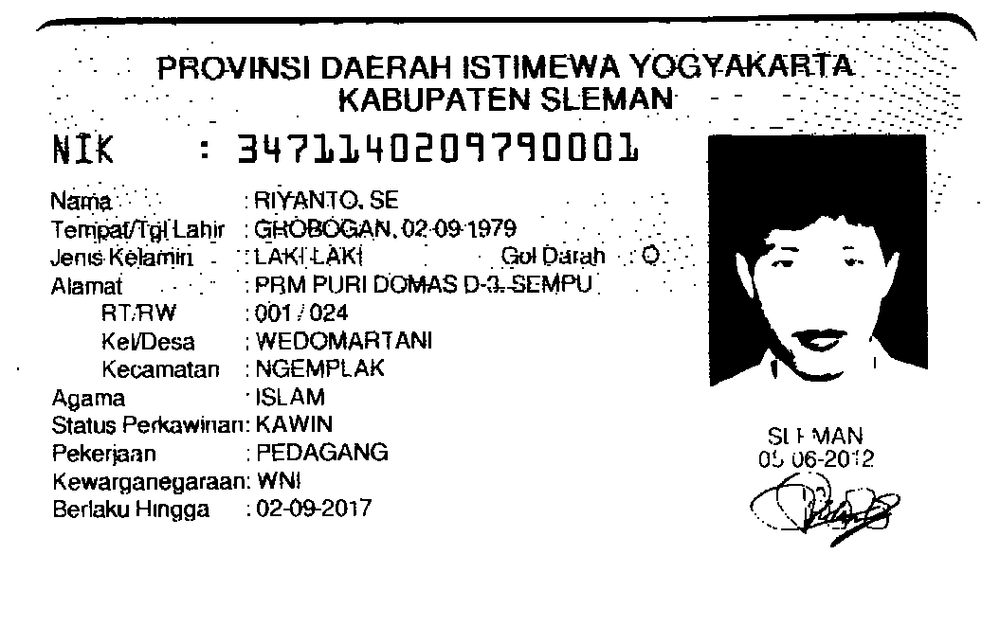

88.0 (338, 600)


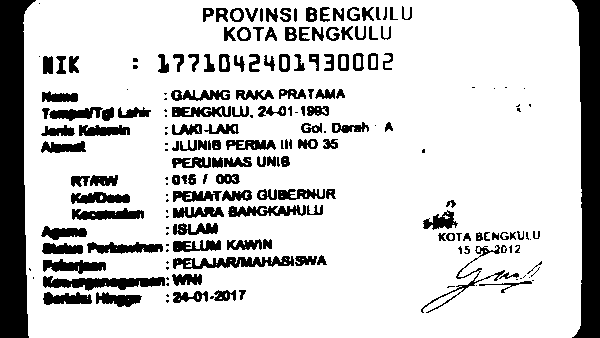

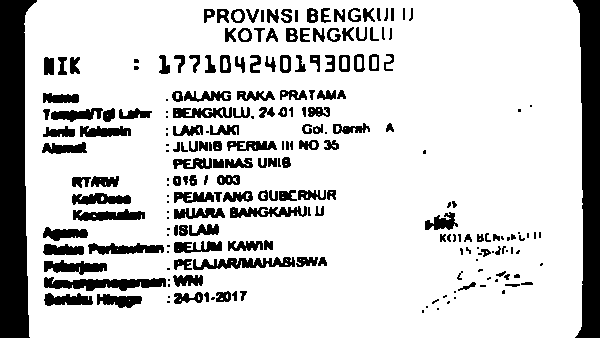

144.0 (707, 1070)


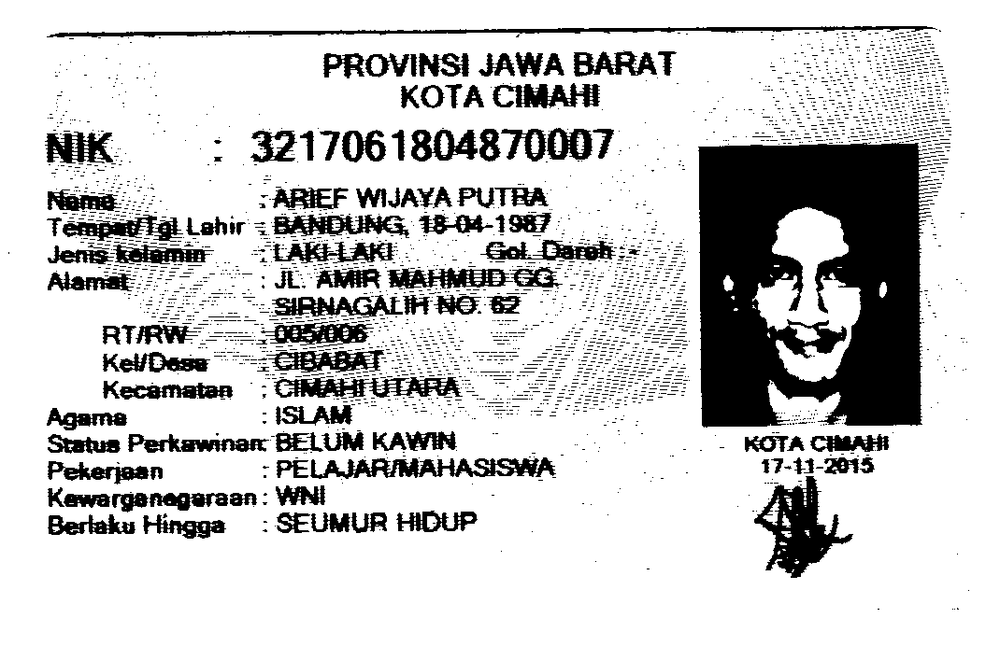

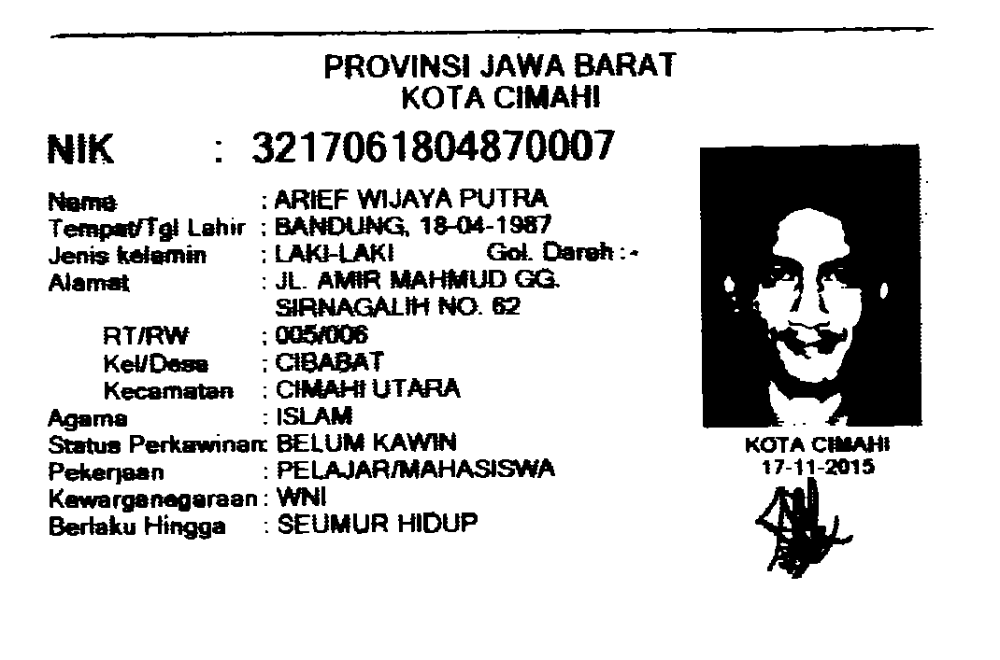

168.0 (300, 493)


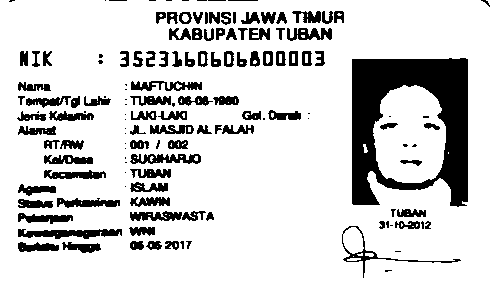

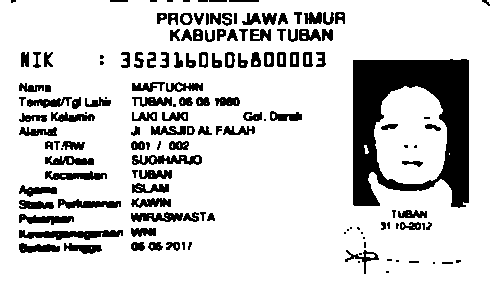

168.0 (300, 493)


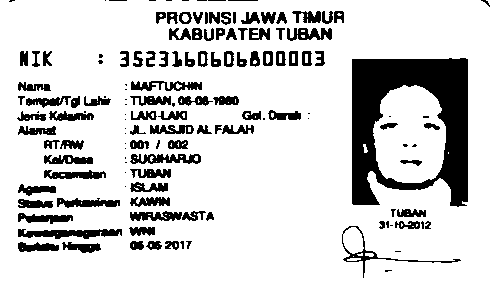

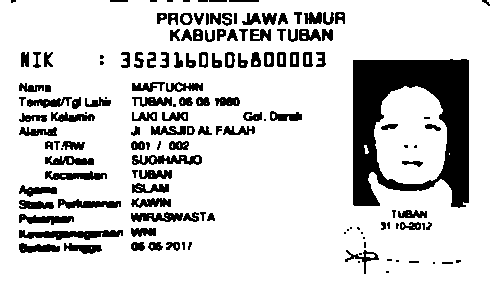

140.0 (381, 608)


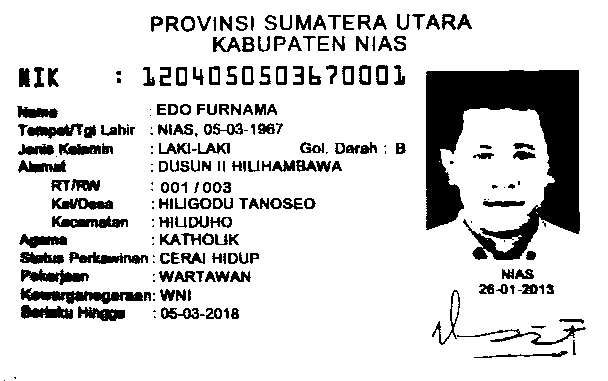

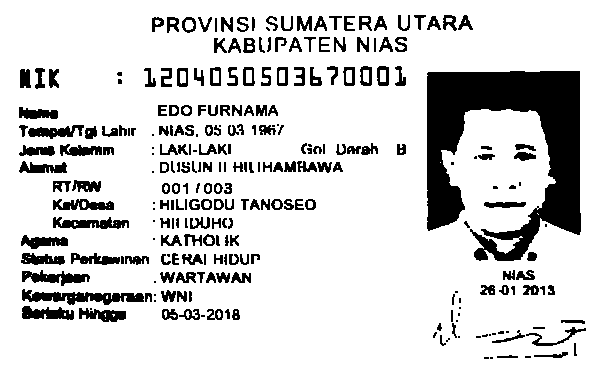

160.0 (636, 996)


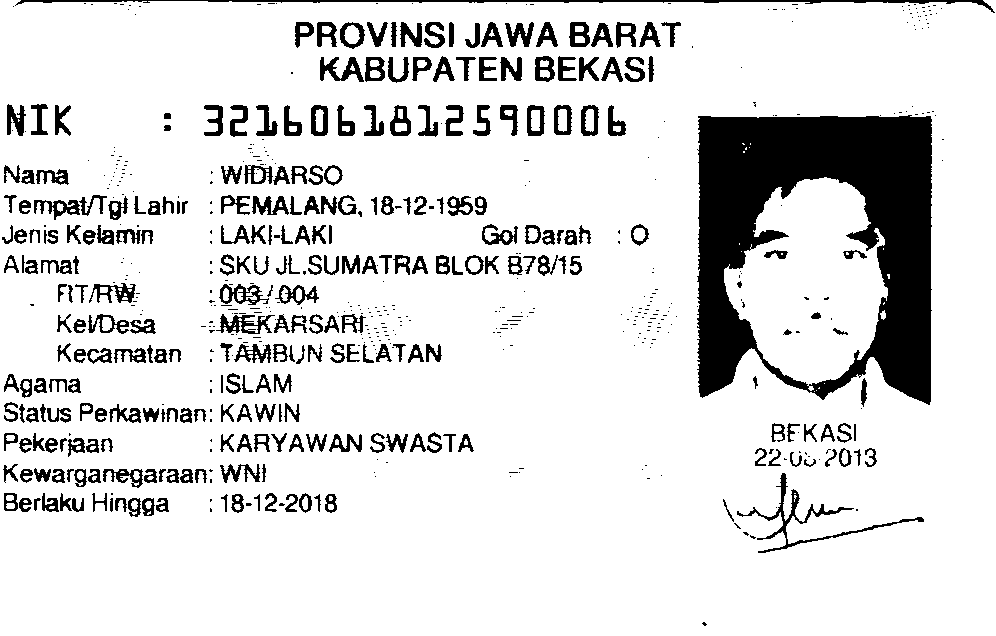

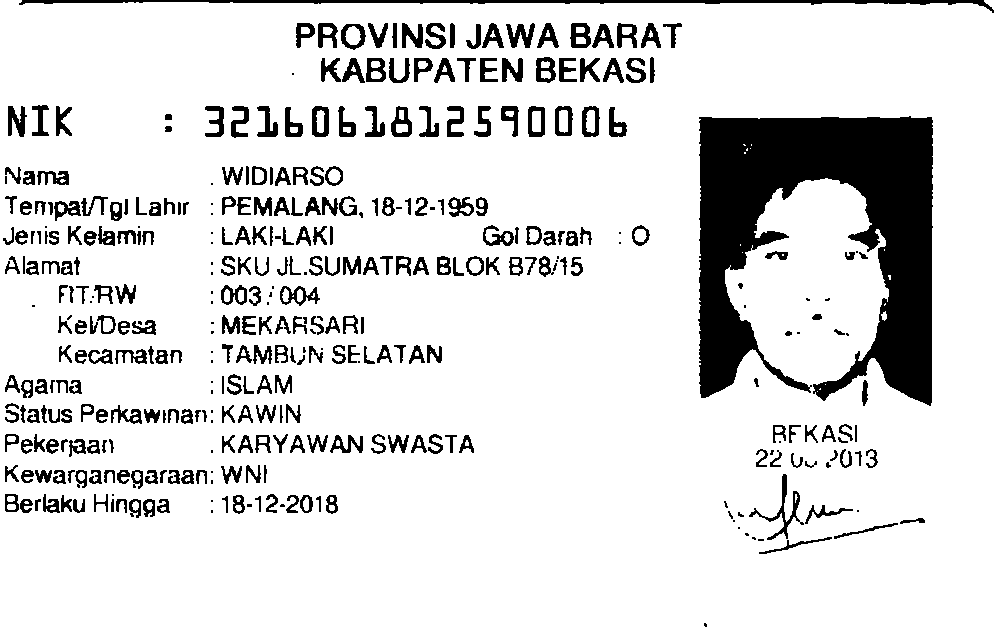

In [ ]:
from google.colab.patches import cv2_imshow

# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/Images/KTP_More/dataset/sliced/"

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
  src = cv.imread(os.path.join(path_plate, name_file))
  blurred = src.copy()
  gray = blurred.copy()

  # Filtering
  for i in range(10):
    blurred = cv.GaussianBlur(src, (5, 5), 0.5)

  # Ubah ke grayscale
  gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
  ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
  print(ret, bw.shape)
  cv2_imshow(bw)

  kernel = np.ones((2,2),np.uint8)
  close = cv.morphologyEx(bw,cv.MORPH_CLOSE, kernel)
  cv2_imshow(close)

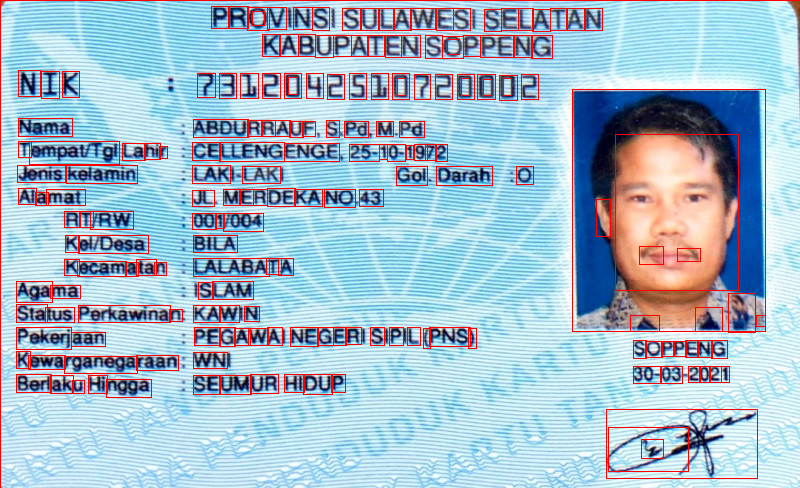

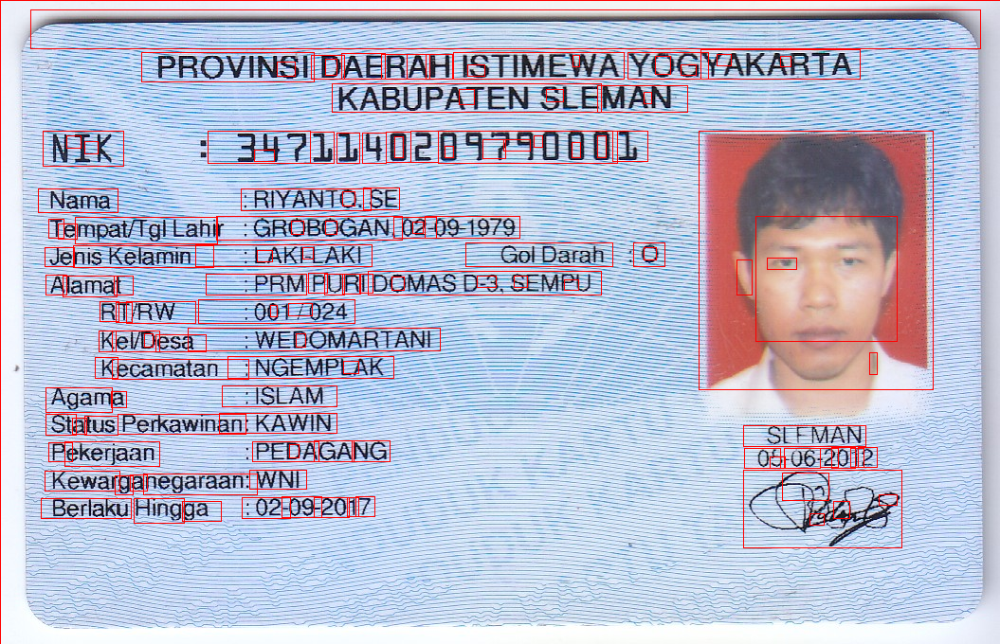

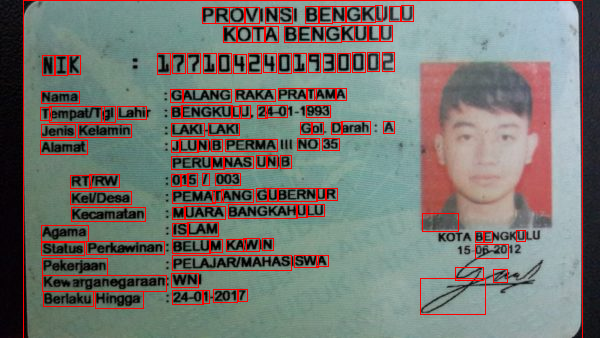

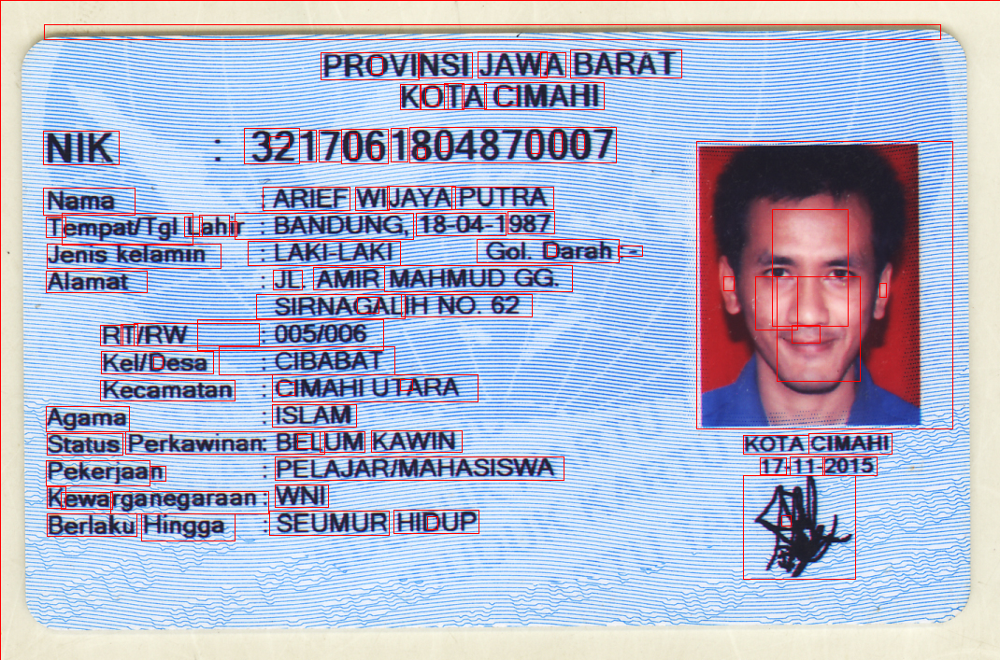

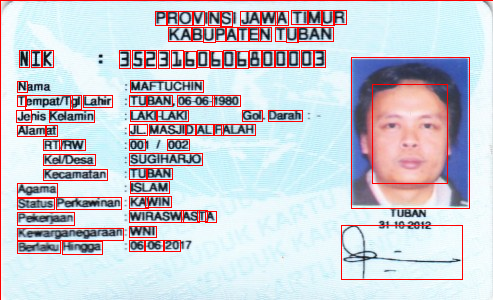

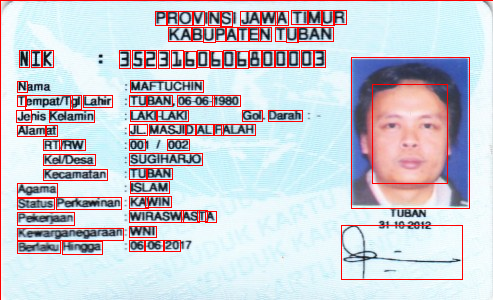

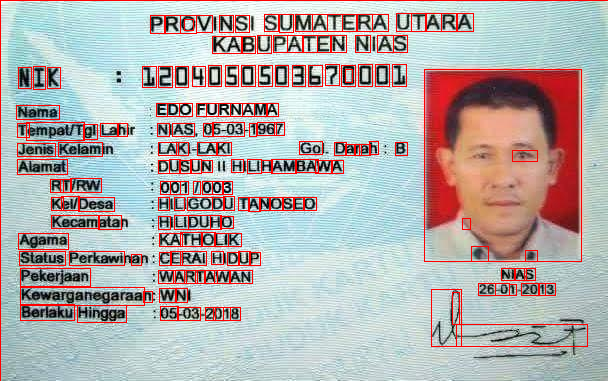

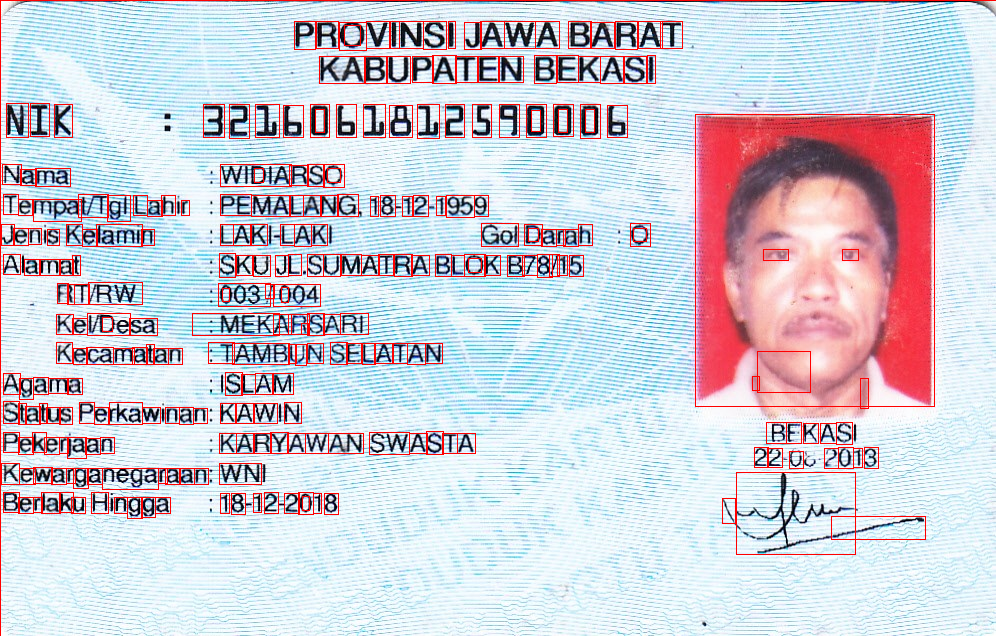

In [ ]:
def extract_contour(image):
  blurred = image.copy()

  # Filtering
  for i in range(10):
    blurred = cv.GaussianBlur(image, (5, 5), 0.5)

  img_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

  ret, bw = cv.threshold(img_gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

  ret, thresh1 = cv.threshold(bw, 150, 255, cv.THRESH_BINARY)
  contours, hierarchy2 = cv.findContours(thresh1, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

  for contour in contours:
    x, y, w, h = cv.boundingRect(contour)
    if w > 6 and h > 10:
      image_2 = cv.rectangle(image, (x, y), (x+w, y+h),(0,0,255),1)

  return image_2

# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/Images/KTP_More/dataset/sliced/"

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
  src = cv.imread(os.path.join(path_plate, name_file))
  image = src.copy()

  image_2 = extract_contour(image)

  cv2_imshow(image_2)

**F. Tugas Praktikum Kelompok 5 - KTP Widiarso Bekasi**

---
- Amalia Salsa Lutfiana (04)
- Maulidio Farhan Rizkullah (19)
- Raden Rizki (25)
- Roziq Mahbubi (27)
- Yofandra Arta Priyoga (30)

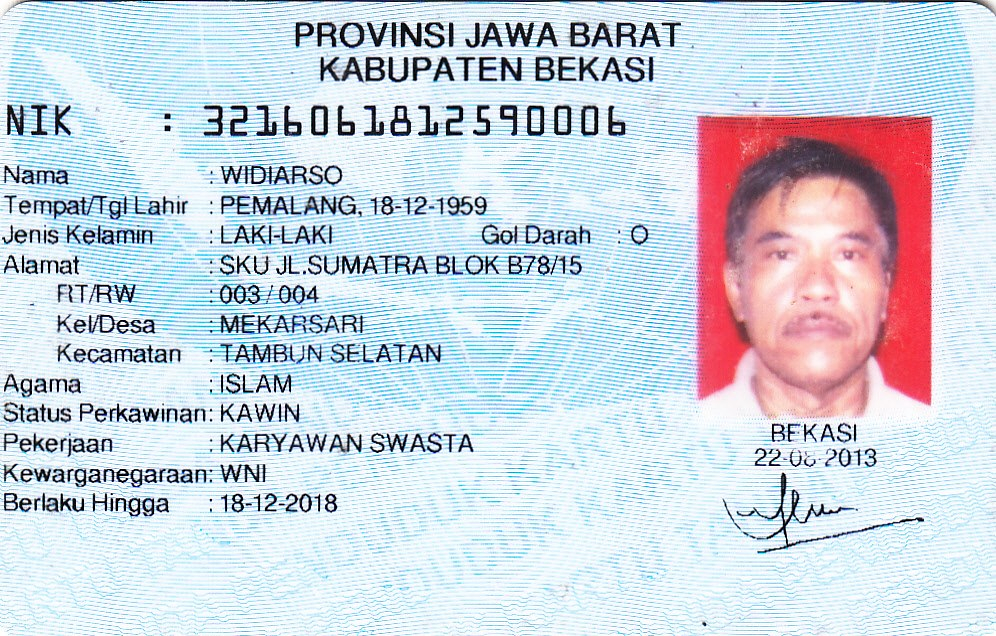

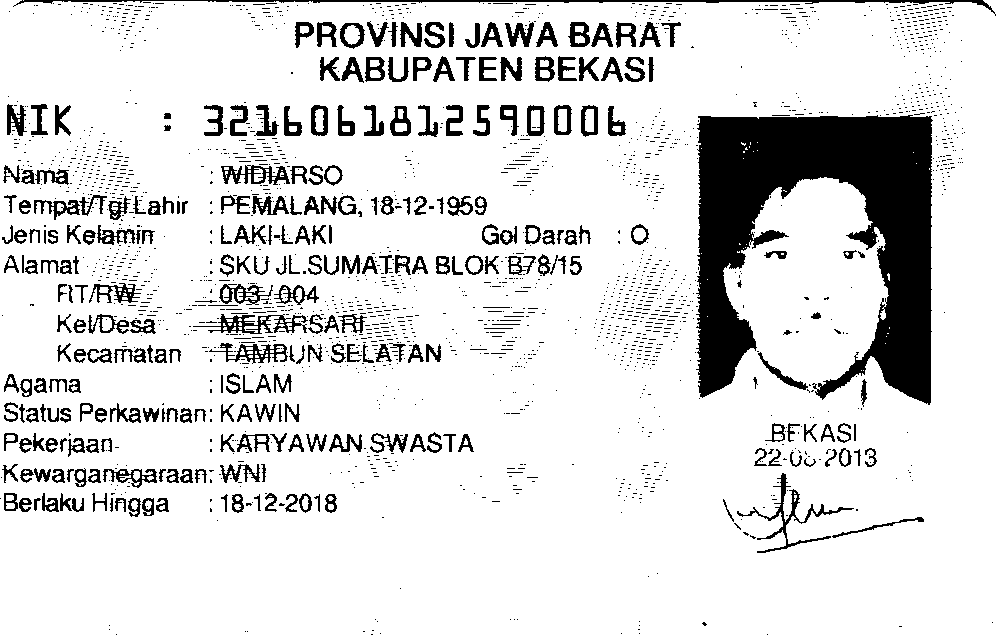

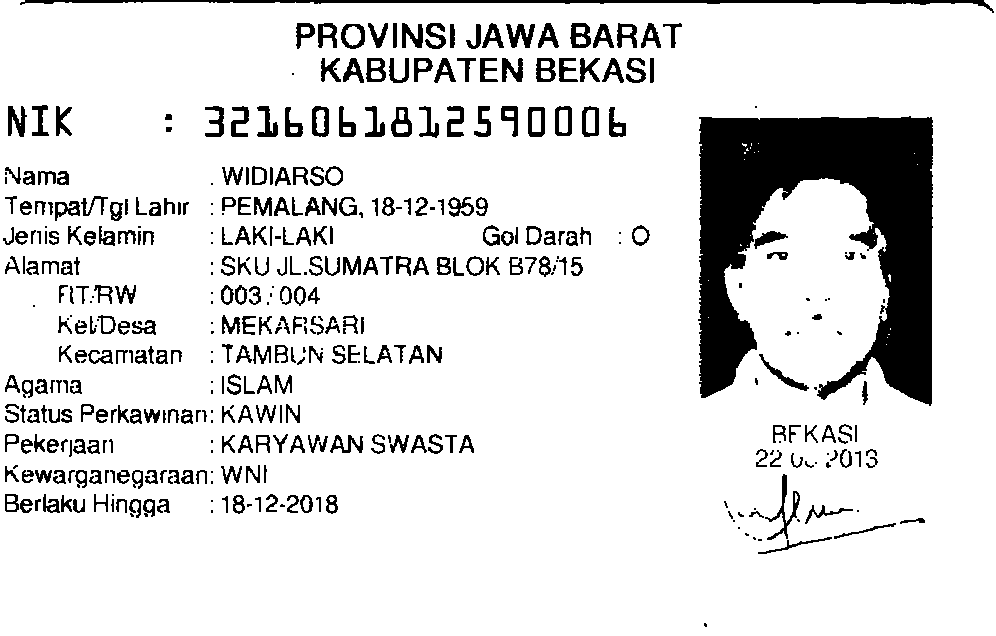

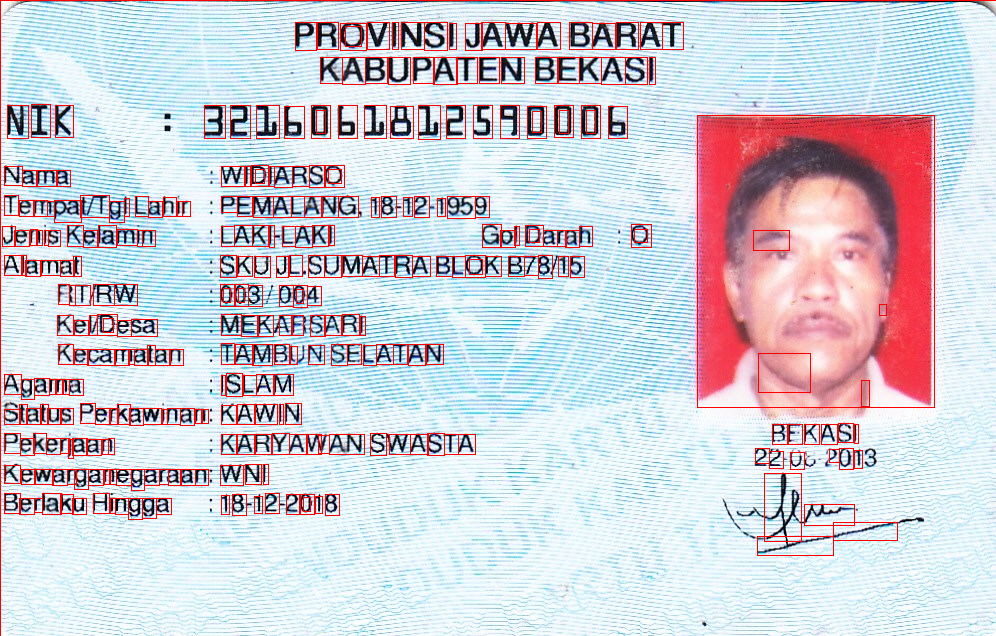

In [ ]:
from skimage import morphology

ktp = cv.imread('/content/drive/MyDrive/Images/KTP_More/ktp6.png')

blurred = cv.GaussianBlur(ktp, (21,21), 0.5)

sharpened2 = cv.addWeighted(ktp, 1.5, blurred,-0.5,0)
cv2_imshow(sharpened2)

gray2 = cv.cvtColor(sharpened2, cv.COLOR_BGR2GRAY)


ret2, bw2 = cv.threshold(gray2, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
# print(ret, bw.shape)

cv2_imshow(bw2)

kernel = np.ones((2,2),np.uint8)

morphology = cv.morphologyEx(bw2, cv.MORPH_CLOSE, kernel)

cv2_imshow(morphology)


contours2, _ = cv.findContours(morphology, cv.RETR_TREE, cv.CHAIN_APPROX_NONE)

for contour in contours2:
  x, y, w, h = cv.boundingRect(contour)
  if(w>3 and h>10):
    result2 = cv.rectangle(ktp, (x, y), (x+w, y+h),(0,0,255),1)

cv2_imshow(result2)